<a href="https://colab.research.google.com/github/ArrozCon-Leche/SegundoParcial./blob/main/SegundoTrabajoEstadistica.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# **1.  CARGA DE LA BASE DE DATOS**

Se importa el modulo files de colab, el cual nos permite subir archivos. De esta manera podemos cargar la base de datos.





In [ ]:
from google.colab import files
uploaded = files.upload()

Saving nac2022.csv to nac2022.csv


# **2. LECTURA DE DATOS**

2.   Se leen los datos y se convierten en una tabla



In [ ]:
import pandas as pd
import io
io_csv = io.BytesIO(uploaded['nac2022.csv'])
tabla = pd.read_csv(io.BytesIO(uploaded['nac2022.csv']), sep = ",", index_col=0, encoding='latin-1')
tabla.head(3)


<ipython-input-5-eefd635bd286>:4: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  tabla = pd.read_csv(io.BytesIO(uploaded['nac2022.csv']), sep = ",", index_col=0, encoding='latin-1')


,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION,TIPOFORMULARIO
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
8,638,1,1,NaN,1,4,4,2022,12,1,...,2,12/10/2015,2,2,2.0,29,3,8,1.0,1
11,1,1,1,NaN,1,6,5,2022,12,1,...,2,12/09/2012,2,1,1.0,24,4,11,1.0,1
27,1,1,1,NaN,2,6,5,2022,12,1,...,4,14/03/2019,4,2,2.0,25,3,9,1.0,1


In [ ]:
df = tabla[["EDAD_PADRE","N_EMB"]]
df.head(3)


,EDAD_PADRE,N_EMB
COD_DPTO,,
8,29,2
11,24,2
27,25,4


# **3. HISTOGRAMAS**


1.   Iniciamos filtrando los datos tanto de la edad de los padres como del numero de embarazos, ya que en ambos casos se ven datos anomalos tales como padres de +100 años y mujeres con +100 embarazos lo cual carece de sentido y dañaria el analisis de los datos.
2.  Se establecen intervalos para ambas variables, estos intervalos inician desde el minimo de cada conjunto de datos y van hasta el maximo de cada conjunto, a su vez se establece el paso con el que avanza cada intervalo: para el caso de la edad de los padres 3 y para el caso de los embarazos 1.

3.  Usando la libreria matplotlib se grafican ambas variables con sus respectivos intervalos y sus etiquetas.






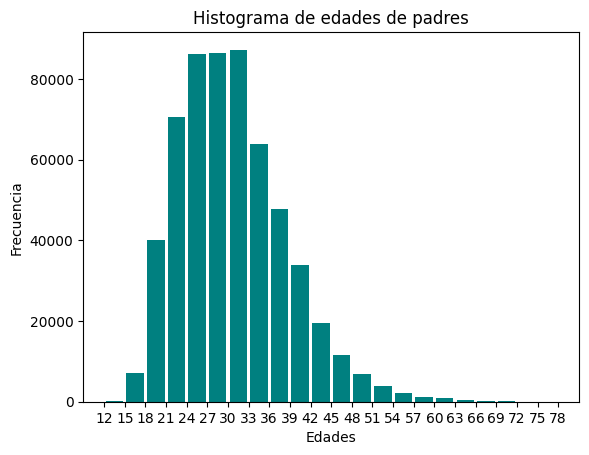

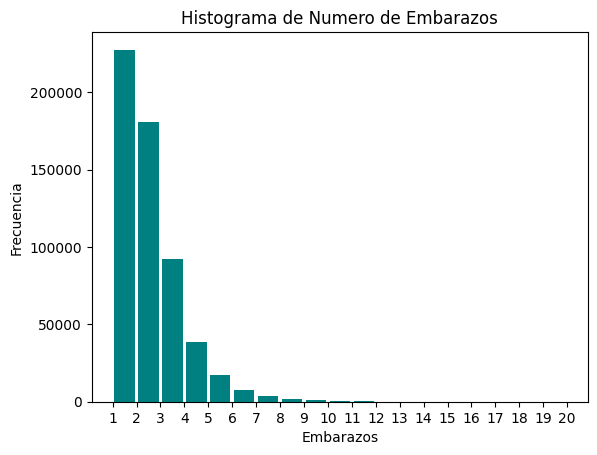

In [ ]:
import matplotlib.pyplot as plot

datos_filtrados = df[(df.EDAD_PADRE >= 0) & (df.EDAD_PADRE <= 100)]    #Se filtran los datos xq al graficarlos salian edades de 1000 años WTF y eso dañaba toda la grafica
datos_filtrados2 = df[(df.N_EMB >= 0) & (df.N_EMB <= 30)]    #Se filtran los datos xq al graficarlos salian personas con casi 100 embarazos WTF y eso dañaba toda la grafica

intervalos = range(min(datos_filtrados.EDAD_PADRE), max(datos_filtrados.EDAD_PADRE)+ 1,3)
plot.hist(datos_filtrados.EDAD_PADRE, bins = intervalos,color='teal',rwidth=0.85)
plot.title("Histograma de edades de padres")
plot.xlabel("Edades")
plot.ylabel("Frecuencia")
plot.xticks(intervalos)
plot.show()


intervalos2 = range(min(datos_filtrados2.N_EMB), max(datos_filtrados2.N_EMB)+ 1,1)
plot.hist(datos_filtrados2.N_EMB, bins = intervalos2,color='teal',rwidth=0.85)
plot.title("Histograma de Numero de Embarazos")
plot.xlabel("Embarazos")
plot.ylabel("Frecuencia")
plot.xticks(intervalos2)
plot.show()

# **INTERPRETACION HISTOGRAMAS**


*   **EDAD DE PADRES:**En este histograma se observa que los valores más frecuentes estan entre los 24 y 36 años. Esta representación permite entender de forma directa en qué edades ocurre la mayor cantidad de paternidades, revelando una tendencia marcada hacia la adultez joven. Además, se observa un sesgo hacia la derecha, ya que la frecuencia disminuye de forma progresiva a medida que aumentan las edades, pero aún existen registros en edades avanzadas, incluso por encima de los 70 años. Esta cola hacia la derecha indica la existencia de casos menos frecuentes pero importantes en edades mayores.

*   **NUMERO DE EMBARAZOS:**En este hisograma podemos observar claramente que la distribucion esta sesgada positivamente con una alta concentracion de casos en los valores mas bajos, mas especificamente la mayoria de las mujeres tiene entre 1 y 2 embarazos. Se ve que la grafica disminuye exponencialmente por lo cual casos con mas de 5 embarazos son relativamente raros y aun mas raros son los casos extremos como 10 o mas embarazos, sin embargo, existen.



# **4. FDP POR UN KERNEL Y BAJO NORMALIDAD**


1.   Se grafican los histogramas normalizados para que queden datos entre 0 y 1
2.   Se grafica el FDP bajo normalidad y se superpone en los hisogramas
3.   Se grafica el FDP por un kernel y se superpone en los hisogramas



<ipython-input-46-c4d9060902c4>:14: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.



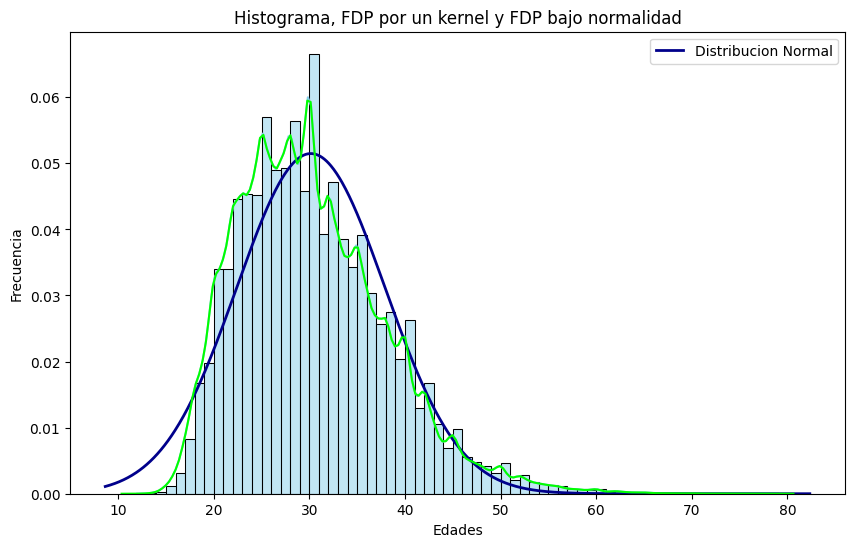

<ipython-input-46-c4d9060902c4>:30: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.



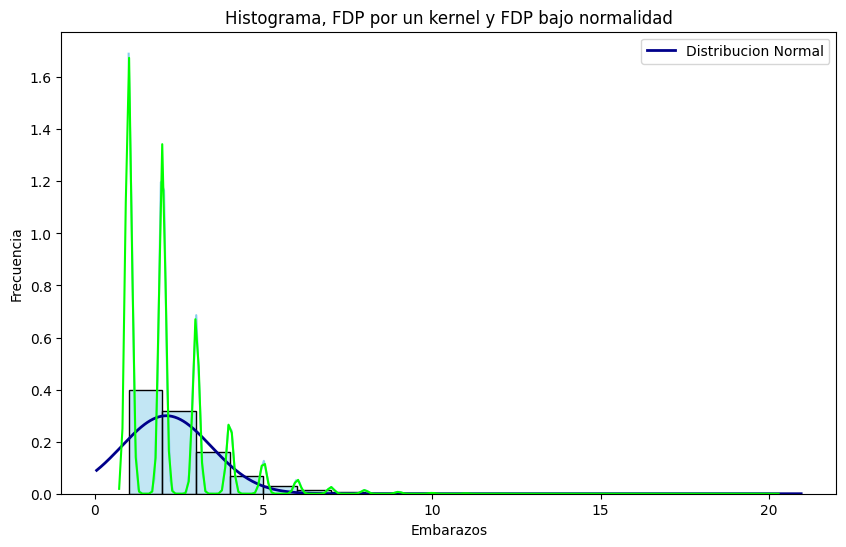

In [ ]:
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt

intervalos1 = range(min(datos_filtrados.EDAD_PADRE), max(datos_filtrados.EDAD_PADRE) + 1)
plt.figure(figsize=(10, 6))
sns.histplot(x=datos_filtrados.EDAD_PADRE, bins=intervalos1, kde=True, stat="density", color="skyblue", edgecolor='black')

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(datos_filtrados.EDAD_PADRE), np.std(datos_filtrados.EDAD_PADRE))

plt.plot(x, p, 'k', linewidth=2, label='Distribucion Normal', color="darkblue")
sns.kdeplot(x=datos_filtrados.EDAD_PADRE,color="lime")
plt.legend()
plt.title("Histograma, FDP por un kernel y FDP bajo normalidad")
plt.xlabel("Edades")
plt.ylabel("Frecuencia")
plt.show()

intervalos2 = range(min(datos_filtrados2.N_EMB), max(datos_filtrados2.N_EMB) + 1)
plt.figure(figsize=(10, 6))
sns.histplot(x=datos_filtrados2.N_EMB, bins=intervalos2, kde=True, stat="density", color="skyblue", edgecolor='black')

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(datos_filtrados2.N_EMB), np.std(datos_filtrados2.N_EMB))

plt.plot(x, p, 'k', linewidth=2, label='Distribucion Normal', color="darkblue")
sns.kdeplot(x=datos_filtrados2.N_EMB,color="lime")
plt.legend()
plt.title("Histograma, FDP por un kernel y FDP bajo normalidad")
plt.xlabel("Embarazos")
plt.ylabel("Frecuencia")
plt.show()

# **INTERPRETACION DE LOS FDP**
En ambos casos la curva estimada por kernel (Linea Verde) sigue de cerca las variaciones reales del conjunto de datos, reflejando con mayor precisión los picos y valles de la distribución. Por otro lado, la curva normal (Linea Azul) suaviza los datos y muestra una simetría que no se ajusta del todo a la realidad observada. Esta diferencia entre ambas curvas en los dos casos confirma que las variables no siguen una distribución normal perfecta, sino que presentan cierta asimetría tal como se habia mencionado anteriormente.

# **5. PRUEBA DE SHAPIRO**

In [ ]:
from scipy.stats import shapiro
shapiro(datos_filtrados.EDAD_PADRE)

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 569875.
  res = hypotest_fun_out(*samples, **kwds)


ShapiroResult(statistic=np.float64(0.9625327992740976), pvalue=np.float64(1.275149158517001e-116))

In [ ]:
from scipy.stats import shapiro
shapiro(datos_filtrados2.N_EMB)

/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 571414.
  res = hypotest_fun_out(*samples, **kwds)


ShapiroResult(statistic=np.float64(0.7745506902400698), pvalue=np.float64(3.8543341411250415e-173))

# **INTERPRETACION PRUEBA DE SHAPIRO**
En ambos casos tenemos que pvalue=0<0.05 por lo cual se rechaza que ambas variables presentan una distribucion normal.

# **6.DIAGRAMA DE CAJAS Y BIGOTES**
Se generan los diagramas de cajas para ambas variables ajustando el tamaño con que se desea la grafica

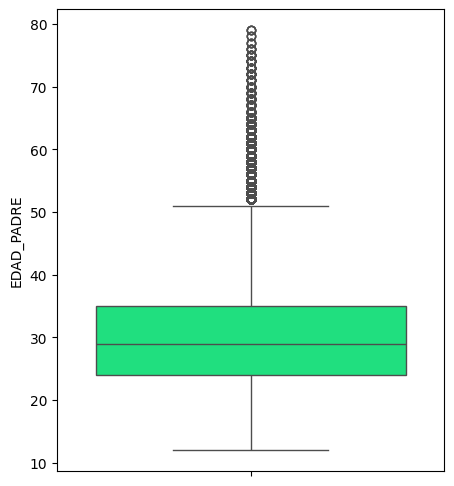

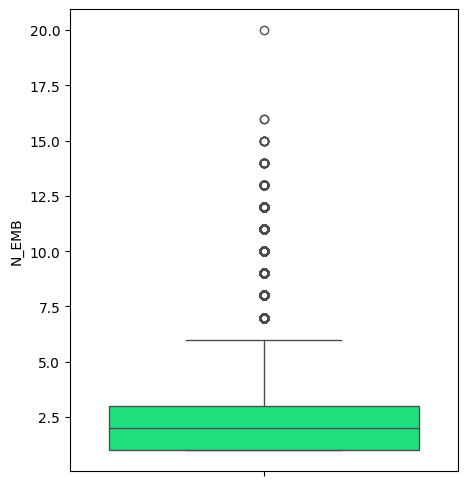

In [ ]:
import seaborn
plt.figure(figsize=(5, 6))
seaborn.boxplot(datos_filtrados.EDAD_PADRE, color='springgreen',saturation=0.75)
plt.show()

plt.figure(figsize=(5, 6))
seaborn.boxplot(datos_filtrados2.N_EMB, color='springgreen',saturation=0.75)
plt.show()

# **INTERPRETACION DIAGRAMAS DE CAJA**


1.   **EDAD DE PADRES:**Viendo los cuartiles, se observa que el primer cuartil se encuentra cerca de los 25 años y el tercer cuartil sobre los 36. Esto indica que el 50 % de los padres están en este rango, lo que reafirma la alta concentración de datos en la etapa adulta joven. Además, se observan numerosos valores atípicos por encima de los 50 años, los cuales están representados por puntos individuales. Estos valores extremos tienen efecto sobre la forma general de la distribución y logran explicar, en parte, la asimetría observada.
2.   **NUMERO DE EMBARAZOS:**El rango intercuartílico indica que el 50% central de los datos tiene aproximadamente 1 a 3 embarazos, indicando que la mayoría de las mujeres han tenido un número menor de embarazos. Los bigotes se extienden hasta el valor máximo que es considerado atípico, en este caso hasta aproximadamente 6 embarazos, este número de embarazos aún son algo frecuentes y no se consideran valores extremos. Por otro lado los puntos fuera de los bigotes (círculos) representan los valores atípicos, es decir, el número de embarazos poco comunes respecto al resto de la población. En esta ultima zona se muestran múltiples circulos desde  7 hasta 20 embarazos lo que indica que hay mujeres con un número mayor de embarazos que el resto, aunque en muy baja proporción.



# **7. DIAGRAMAS DE PUNTOS**
Se visualizan las distribuciónes de amas variables  como un conjunto de puntos individuales dispersos horizontalmente.

In [ ]:
import plotly.express as px
plt.figure(figsize=(5,6))
fig = px.strip(datos_filtrados.EDAD_PADRE, orientation='h')
fig.show()



<Figure size 500x600 with 0 Axes>

In [ ]:
import plotly.express as px
plt.figure(figsize=(5,6))
fig = px.strip(datos_filtrados2.N_EMB, orientation='h')
fig.show()

<Figure size 500x600 with 0 Axes>

# **INTERPRETACION DIAGRAMAS DE PUNTOS**


1.   **EDAD DE PADRES:**se observan valores desde edades muy tempranas, como los 12 años, lo cual podría corresponder a casos atípicos o excepcionales que forman parte de la base de datos. Este gráfico refuerza la idea de que, si bien existe un grupo numeroso de padres jóvenes, también hay una diversidad considerable en cuanto a edades, aunque en una menor proporción.
2.   **NUMERO DE EMBARAZOS:**En el diagrama de puntos la variable muestra una distribución asimetrica a la derecha, es decir, concentrada en los valores más bajos con mayor concentración de puntos entres los intervalos (0-5) y (5-10) lo que sugiere que la mayoría de datos se encuentre en ese rango. A partir, de aproximadamente el valor 12 se observa que la frecuencia decrece de manera exponencial, indicando que son valores poco comunes en la ahora realidad colombiana. Se presentan valores atípico (outliers) como el punto 20 ya que se encuentra aislado y ocurre una sola vez.





# **8. MEDIDAS DE ESTADISTICA DESCRIPTIVA**
Se calculan las siguientes medidas: Media, Varianza, Desviacion, Asimetria y Curtosis.

In [ ]:
import numpy as np
from scipy.stats import skew, kurtosis

media = np.mean(datos_filtrados.EDAD_PADRE)
varianza = np.var(datos_filtrados.EDAD_PADRE)
desviacion_estandar = np.std(datos_filtrados.EDAD_PADRE)
asimetria = skew(datos_filtrados.EDAD_PADRE)
curtosis = kurtosis(datos_filtrados.EDAD_PADRE)

media, varianza, desviacion_estandar, asimetria, curtosis = calcular_estadisticas(datos_filtrados.EDAD_PADRE)

print(f"Media: {media}")
print(f"Varianza {varianza}")
print(f"Asimetría: {asimetria}")
print(f"Curtosis: {curtosis}")

media2 = np.mean(datos_filtrados2.N_EMB)
varianza2 = np.var(datos_filtrados2.N_EMB)
desviacion_estandar2 = np.std(datos_filtrados2.N_EMB)
asimetria2 = skew(datos_filtrados2.N_EMB)
curtosis2 = kurtosis(datos_filtrados2.N_EMB)

media2, varianza2, desviacion_estandar2, asimetria2, curtosis2 = calcular_estadisticas(datos_filtrados2.N_EMB)

print(f"Media: {media2}")
print(f"Varianza {varianza2}")
print(f"Asimetría: {asimetria2}")
print(f"Curtosis: {curtosis2}")


Media: 30.15723623601667
Varianza 60.06178521092598
Asimetría: 0.796056544852194
Curtosis: 0.9077498960400026
Media: 2.116902981026016
Varianza 1.7739272766656256
Asimetría: 1.9166503588622112
Curtosis: 5.943850840612972


# **INTERPRETACION MEDIDAS DE ESTADISTICA DESCRIPTIVA**


1.   **EDAD DE PADRES:**se puede decir que el promedio de la edad de un padre de un recién nacido en Colombia es de 30 años, teniendo en cuenta que la media aritmética es de 30,16. Además, se observa que la varianza es 60,06, por lo que su desviación estándar es aproximadamente 7,75. Esto indica que la distancia entre los valores de la edad de un padre de un recién nacido en Colombia y la media es de 30,15 años lo cual indica que en promedio los padres tienen esta edad. También se tiene que la distribución de la edad de los padres es asimétrica positiva; es decir, la media es mayor que la moda. Por último, se observa que hay una baja concentración de valores en torno a la media, lo cual se concluye porque la curtosis es menor que 3, lo que indica que la distribución es platicúrtica.
2.   **NUMERO DE EMBARAZOS:**La media aritmética del número de embarazos es 2.116902981026016. Esto indica que, en promedio, las mujeres de la muestra han tenido poco más de 2 embarazos. La media es sensible a valores extremos, por lo que puede estar levemente influenciada por los casos atípicos.La varianza mide la dispersión de los datos respecto a la media un valor de 1.7739 indica una moderada variabilidad en el número de embarazos.La asimetría positiva de 1.9166 confirma que la distribución de los datos está sesgada hacia la derecha (positivamente), es decir, hay valores bajos (pocos embarazos) y una cola larga de valores altos. Este valor supera 1, lo que indica una alta simetría coherente con los gráficos observados anteriormente.La curtosis con un valor de 5.9438 indica una distribucion leptocúrtica, es decir, la distribución tiene un pico más agudo que la normal y colas más pesadas. Lo que sugiere que existen valores extremos más frecuentes de los esperado bajo una distribución normal.



# **9. DIAGRAMA DE DISPERSION Y RECTA DE REGRESION**


1.   Se genera un grafico de dispersion entre las 2 variables
2.   Se filtran los datos extremos
3.   Se crea un modelo de regresion lineal
4.   Se grafica la linea de regresion



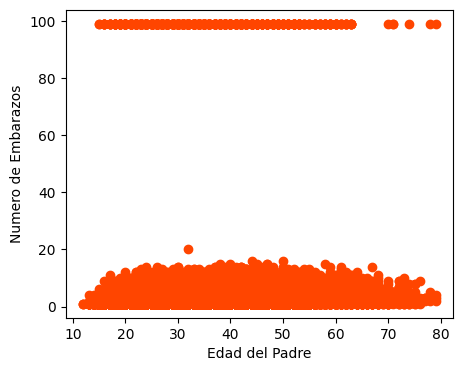

In [ ]:
plt.figure(figsize=(5,4))
plt.scatter(datos_filtrados.EDAD_PADRE,datos_filtrados.N_EMB, color = 'orangered',marker ='o')
plt.xlabel("Edad del Padre")
plt.ylabel("Numero de Embarazos")
plt.show()



In [ ]:
df1 = df[(df.EDAD_PADRE<100) & (df.N_EMB < 99)]

from sklearn.linear_model import LinearRegression
modelo = LinearRegression()
modelo.fit(np.array(df1['EDAD_PADRE']).reshape(-1,1),np.array(df1['N_EMB']).reshape(-1,1))
predicciones = modelo.predict(np.array(df1['EDAD_PADRE']).reshape(-1,1))
predicciones

array([[2.04934873],
       [1.75368043],
       [1.81281409],
       ...,
       [1.63541311],
       [2.75895263],
       [1.81281409]])

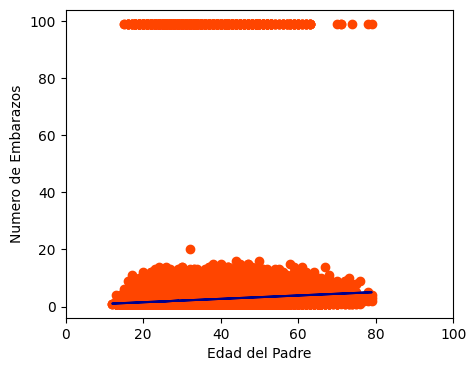

In [ ]:
plt.figure(figsize=(5,4))
plt.scatter(datos_filtrados.EDAD_PADRE,datos_filtrados.N_EMB, color = 'orangered',marker ='o')
plt.plot(df1['EDAD_PADRE'],predicciones, color = 'darkblue')
plt.xlim(0, 100)
plt.xlabel("Edad del Padre")
plt.ylabel("Numero de Embarazos")
plt.show()

# **INTERPRETACION REGRESION LINEAL**
Con las graficas es posible observar que no hay un patrón particular entre los datos, lo que indica que las variables son independientes o no estan correlacionadas. Es decir, el número de embarazos y la edad del padre no tienen ningún tipo de relación entre ellos, pues existen padres jóvenes con muchos hijos y padres de edad avanzada con solo uno o dos hijos.Con la linea de regresion se puede observar la tendencia, se determina una correlación con inclinaciones a ser positiva, es decir, entre más edad tiene el padre, más hijos tiene. Lo que indica que ambas variables son independientes, pero si existe una correlación entre ellas.


# **10. CORRELACION**
Se calculan 3 tipos de correlacion diferentes entre las variables para determinar si existe relacion entre ellas y de que tipo.

In [ ]:
import numpy as np
from scipy.stats import spearmanr
from scipy.stats import kendalltau
pearson_corr = np.corrcoef(df1["EDAD_PADRE"], df1["N_EMB"])[0, 1]
pearman_corr, _ = spearmanr(df1["EDAD_PADRE"], df1["N_EMB"])
kendall_corr, _ = kendalltau(df1["EDAD_PADRE"], df1["N_EMB"])
print(f"Correlacion de Pearson: {pearson_corr}")
print(f"Correlacion de Spearman: {pearman_corr}")
print(f"Correlacion de Kendall: {kendall_corr}")

Correlacion de Pearson: 0.3439949710988243
Correlacion de Spearman: 0.37090767244999157
Correlacion de Kendall: 0.28930213851230707


# **INTERPRETACION CORRELACION**
Para la interpretación de estos coeficientes se usó como guía el articulo “Medición de la concordancia del observador para datos categóricos”. En el cual se mencionan los grados de correlación entre dos variables independientes. Lo que permitió clasificar el coeficiente de Pearson, el coeficiente de Spearman y el coeficiente de Kendall como discretos. Teniendo como resultado que la edad del padre y el número de embarazos son discretamente dependientes.